# Focus stack 40x

In [6]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import focus_stack as stk

EXTENSIONS = set(["bmp", "jpeg", "jpg", "png", "tif", "tiff"])

src_dir = "Muestra10"
src_contents = os.walk(src_dir)
dirpath, _, fnames = next(src_contents)

image_dir = os.path.split(dirpath)[-1]

print("Processing '" + image_dir + "' folder...")

image_files = sorted([os.path.join(dirpath, name) for name in fnames])
image_files = [cv2.imread(name) for name in image_files
          if os.path.splitext(name)[-1][1:].lower() in EXTENSIONS]

if any([image is None for image in image_files]):
    raise RuntimeError("One or more input files failed to load.")
print(image_dir + " folder is ready")

Processing 'Muestra10' folder...
Muestra10 folder is ready


Comparamnos con una de las imágenes de partida:

Image 0


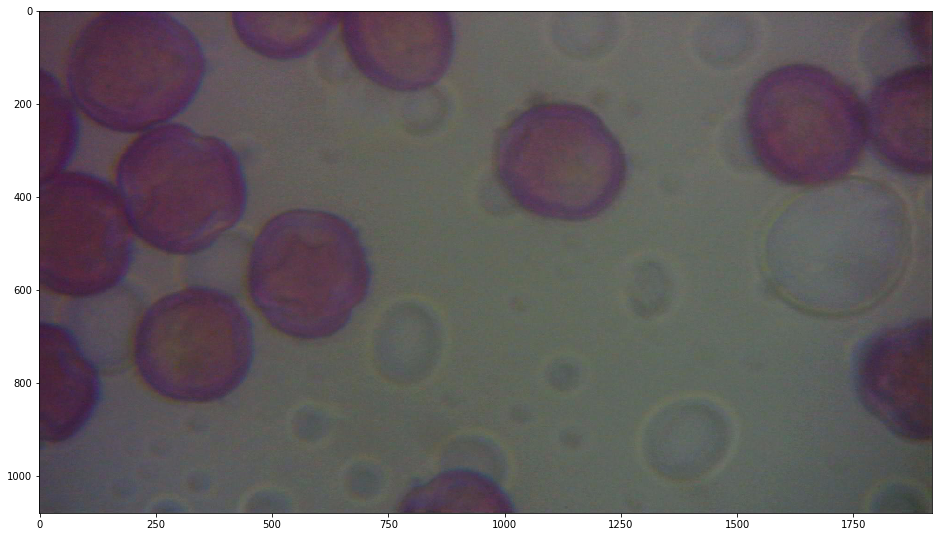

In [7]:
plt.figure(figsize=(16,11))
print('Image 0')
plt.imshow(cv2.cvtColor(image_files[0], cv2.COLOR_BGR2RGB))
plt.show()

Image 5


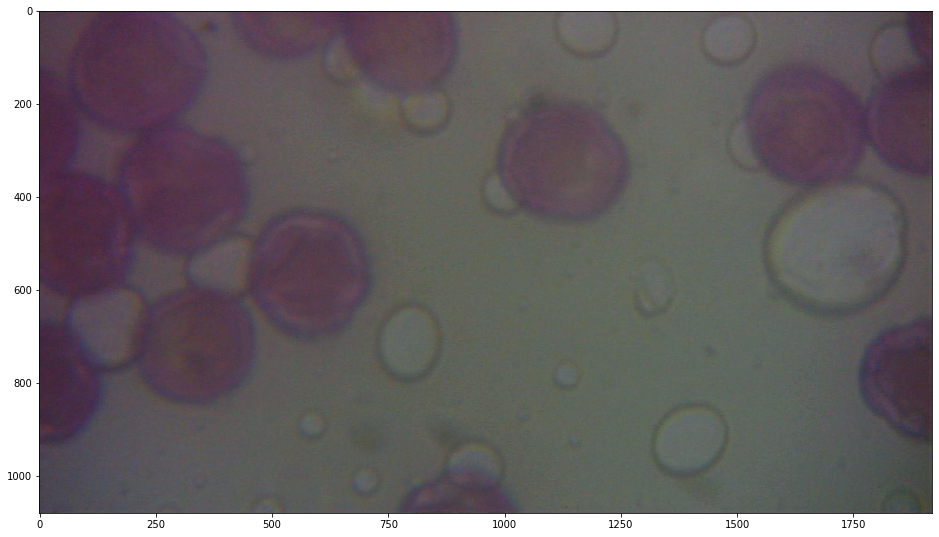

In [10]:
plt.figure(figsize=(16,11))
print('Image 5')
plt.imshow(cv2.cvtColor(image_files[5], cv2.COLOR_BGR2RGB))
plt.show()

Image 2


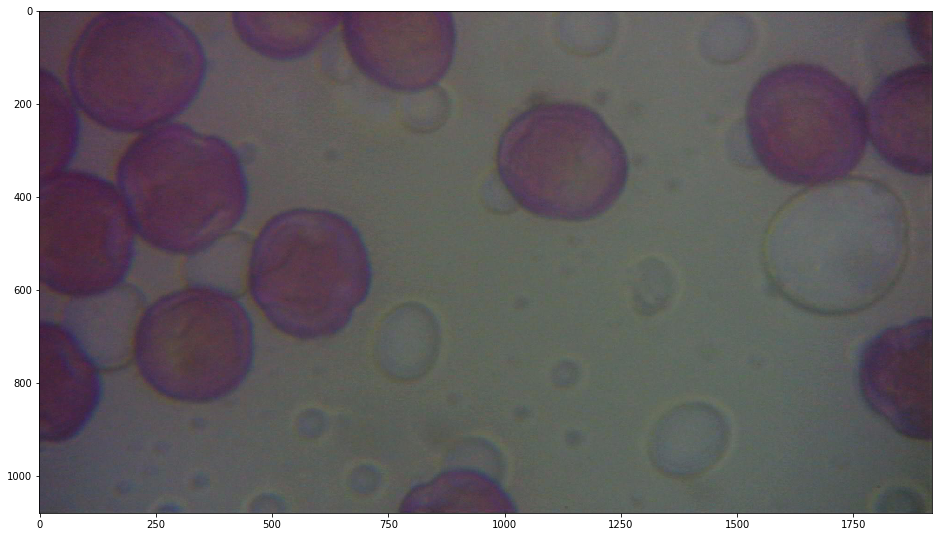

In [11]:
plt.figure(figsize=(16,11))
print('Image 2')
plt.imshow(cv2.cvtColor(image_files[2], cv2.COLOR_BGR2RGB))
plt.show()

Realizando focus stack
Focus stack realizado


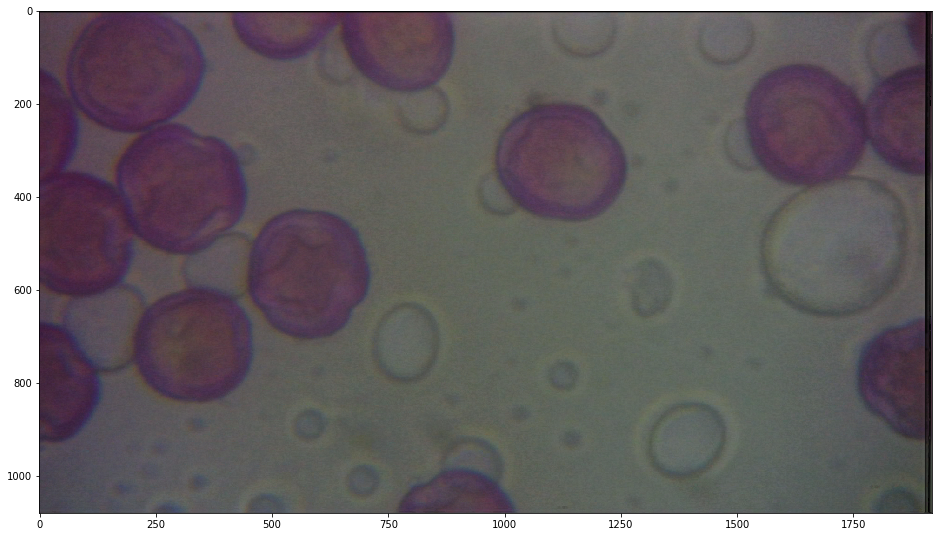

In [12]:
print("Realizando focus stack")
stacked = stk.stack_focus(
    image_files,
    choice=stk.CHOICE_PYRAMID,
    energy=stk.ENERGY_LAPLACIAN,
    pyramid_min_size=32,
    kernel_size=5,
    blur_size=5,
    smooth_size=32)
print("Focus stack realizado")
plt.figure(figsize=(16,11))
plt.imshow(cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB))
plt.show()

In [13]:
#Save image
cv2.imwrite('focus_stack_40x.jpg',stacked)

True

# Focus Stack 10x

Processing 'Muestra10' folder...
Muestra10 folder is ready
Image 1


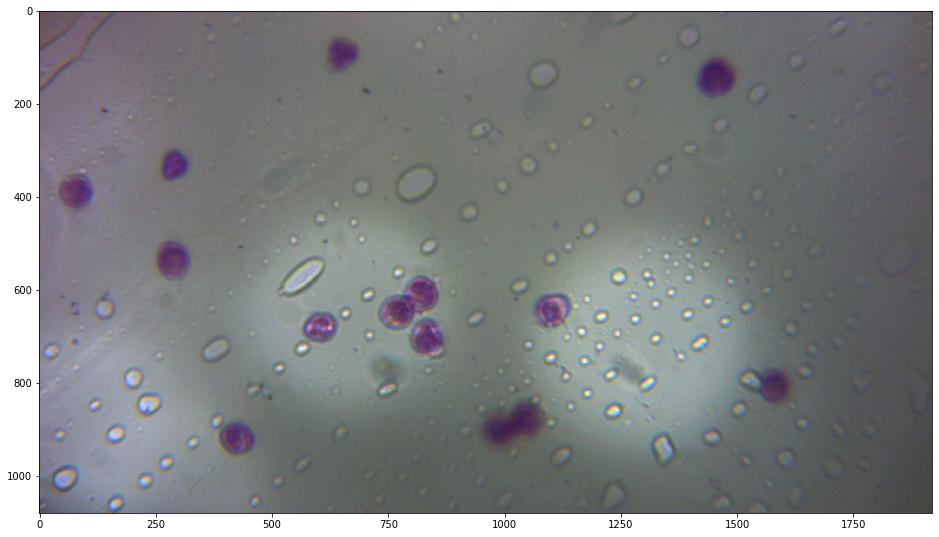

Image 4


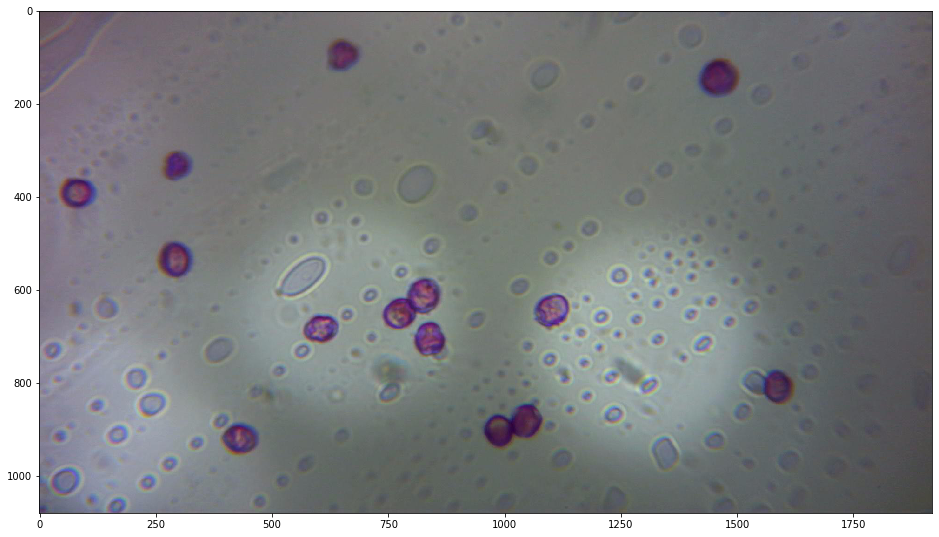

Image 6


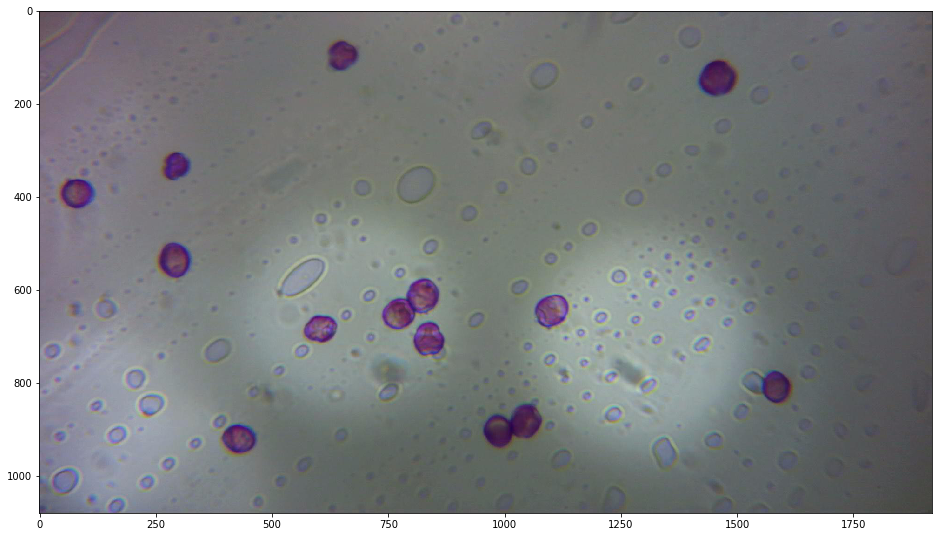

Realizando focus stack
Focus stack realizado


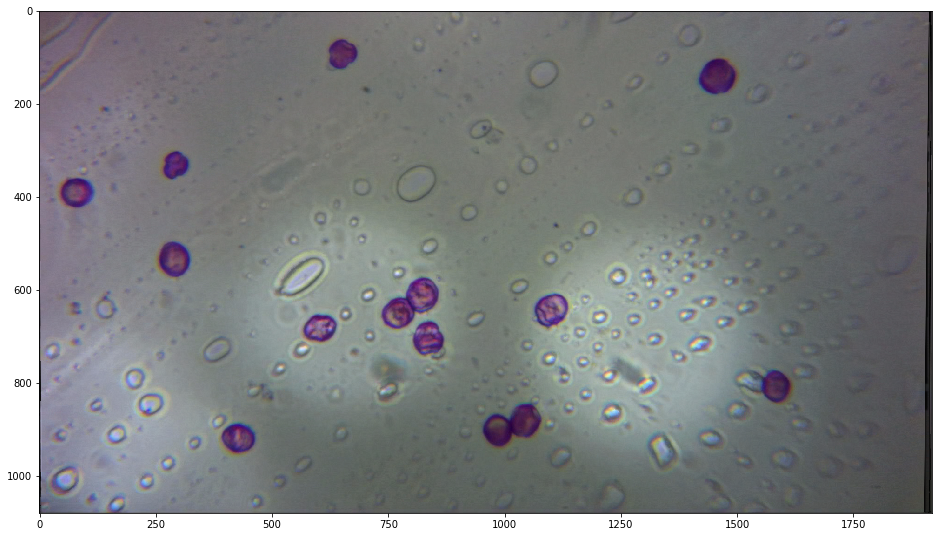

True

In [14]:
EXTENSIONS = set(["bmp", "jpeg", "jpg", "png", "tif", "tiff"])

src_dir = "Muestra10"
src_contents = os.walk(src_dir)
dirpath, _, fnames = next(src_contents)

image_dir = os.path.split(dirpath)[-1]

print("Processing '" + image_dir + "' folder...")

image_files = sorted([os.path.join(dirpath, name) for name in fnames])
image_files = [cv2.imread(name) for name in image_files
          if os.path.splitext(name)[-1][1:].lower() in EXTENSIONS]

if any([image is None for image in image_files]):
    raise RuntimeError("One or more input files failed to load.")
print(image_dir + " folder is ready")
################################################################
plt.figure(figsize=(16,11))
print('Image 1')
plt.imshow(cv2.cvtColor(image_files[1], cv2.COLOR_BGR2RGB))
plt.show()
################################################################
plt.figure(figsize=(16,11))
print('Image 4')
plt.imshow(cv2.cvtColor(image_files[4], cv2.COLOR_BGR2RGB))
plt.show()
################################################################
plt.figure(figsize=(16,11))
print('Image 6')
plt.imshow(cv2.cvtColor(image_files[6], cv2.COLOR_BGR2RGB))
plt.show()
print("Realizando focus stack")
################################################################
stacked = stk.stack_focus(
    image_files,
    choice=stk.CHOICE_PYRAMID,
    energy=stk.ENERGY_LAPLACIAN,
    pyramid_min_size=32,
    kernel_size=5,
    blur_size=5,
    smooth_size=32)
print("Focus stack realizado")
plt.figure(figsize=(16,11))
plt.imshow(cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB))
plt.show()
################################################################
cv2.imwrite('focus_stack_10x.jpg',stacked)

# Image + Focus Stack: 10x

In [21]:
###Algoritmo de Image Stack
import os
import cv2
import numpy as np
from time import time


# Align and stack images with ECC method
# Slower but more accurate
def stackImagesECC(file_list):
    M = np.eye(3, 3, dtype=np.float32)

    first_image = None
    stacked_image = None

    for file in file_list:
        image = cv2.imread(file,1).astype(np.float32) / 255
        print(file)
        if first_image is None:
            # convert to gray scale floating point image
            first_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
            stacked_image = image
        else:
            # Estimate perspective transform
            s, M = cv2.findTransformECC(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY), first_image, M, cv2.MOTION_HOMOGRAPHY)
            w, h, _ = image.shape
            # Align image to first image
            image = cv2.warpPerspective(image, M, (h, w))
            stacked_image += image

    stacked_image /= len(file_list)
    stacked_image = (stacked_image*255).astype(np.uint8)
    return stacked_image


# Align and stack images by matching ORB keypoints
# Faster but less accurate
def stackImagesKeypointMatching(file_list):

    orb = cv2.ORB_create()

    # disable OpenCL to because of bug in ORB in OpenCV 3.1
    cv2.ocl.setUseOpenCL(False)

    stacked_image = None
    first_image = None
    first_kp = None
    first_des = None
    for file in file_list:
        print(file)
        image = cv2.imread(file,1)
        imageF = image.astype(np.float32) / 255

        # compute the descriptors with ORB
        kp = orb.detect(image, None)
        kp, des = orb.compute(image, kp)

        # create BFMatcher object
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

        if first_image is None:
            # Save keypoints for first image
            stacked_image = imageF
            first_image = image
            first_kp = kp
            first_des = des
        else:
             # Find matches and sort them in the order of their distance
            matches = matcher.match(first_des, des)
            matches = sorted(matches, key=lambda x: x.distance)

            src_pts = np.float32(
                [first_kp[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [kp[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            # Estimate perspective transformation
            M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
            w, h, _ = imageF.shape
            imageF = cv2.warpPerspective(imageF, M, (h, w))
            stacked_image += imageF

    stacked_image /= len(file_list)
    stacked_image = (stacked_image*255).astype(np.uint8)
    return stacked_image

Processing '0' folder...
0 folder


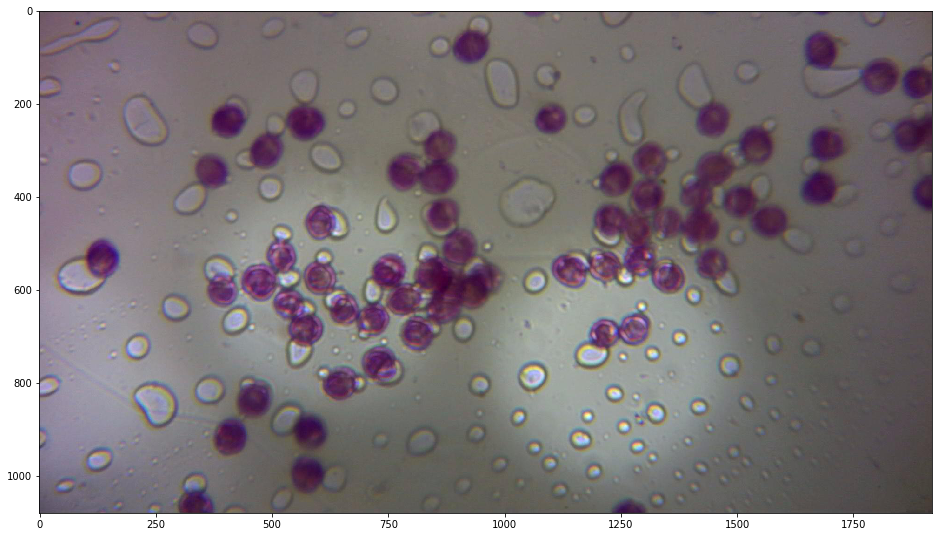

Processing '1' folder...
1 folder


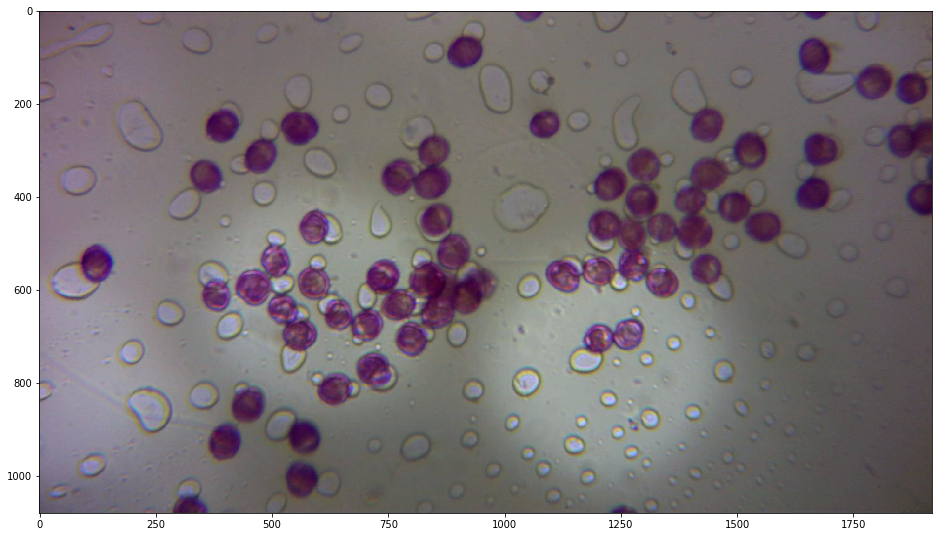

Processing '2' folder...
2 folder


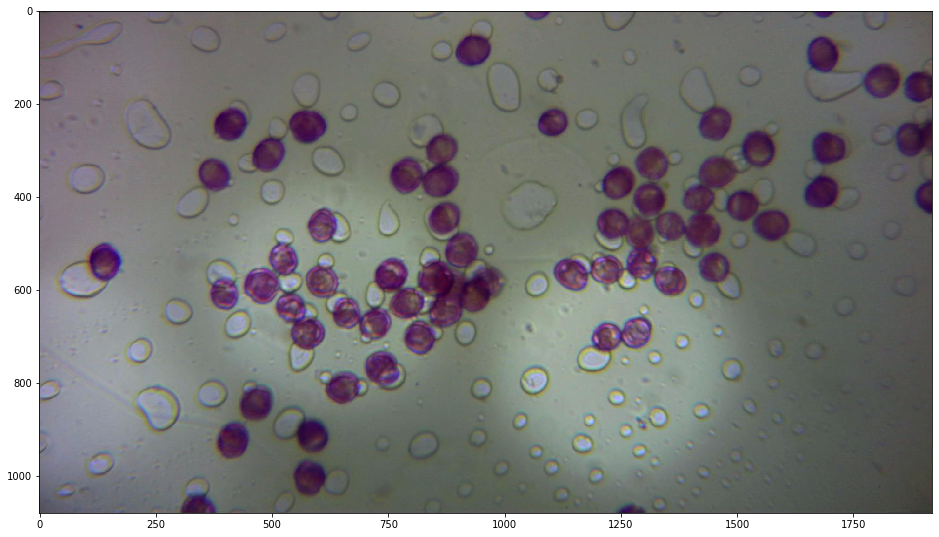

Processing '3' folder...
3 folder


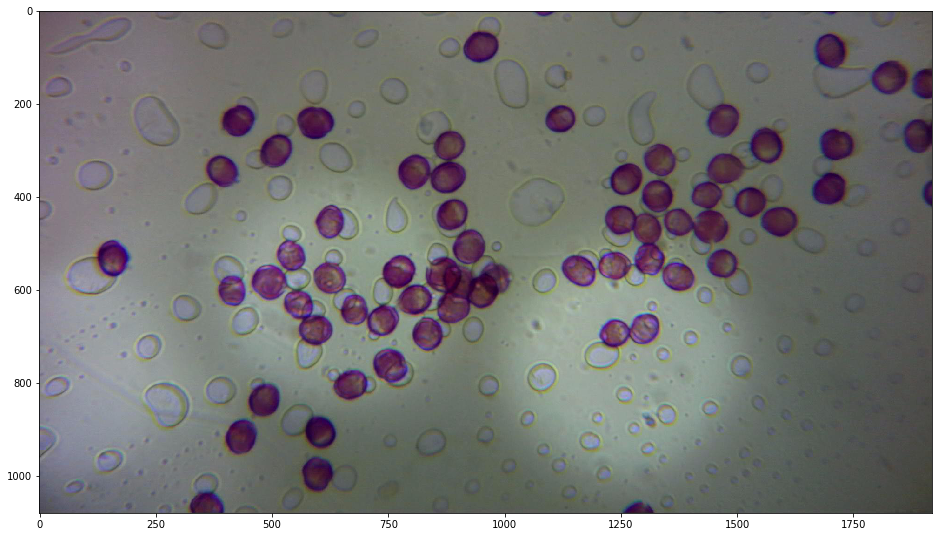

Processing '4' folder...
4 folder


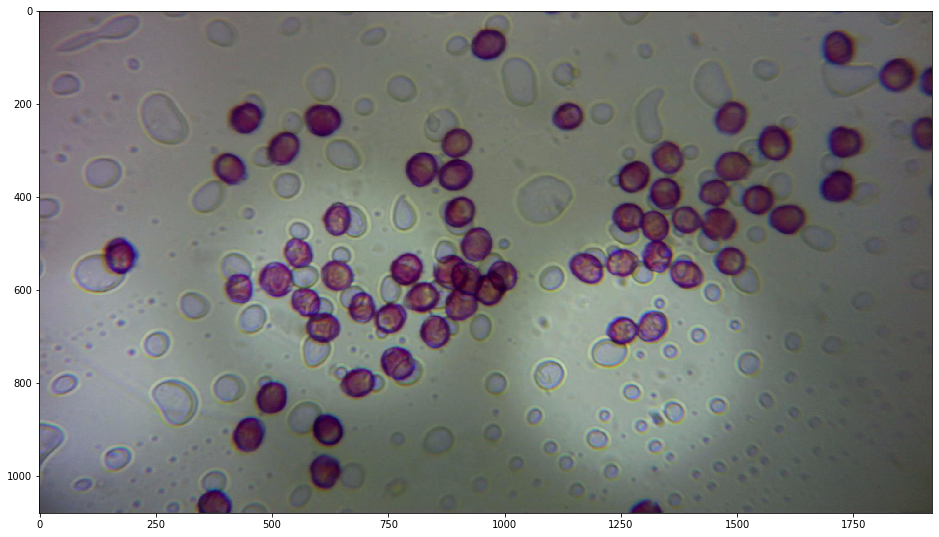

Processing '5' folder...
5 folder


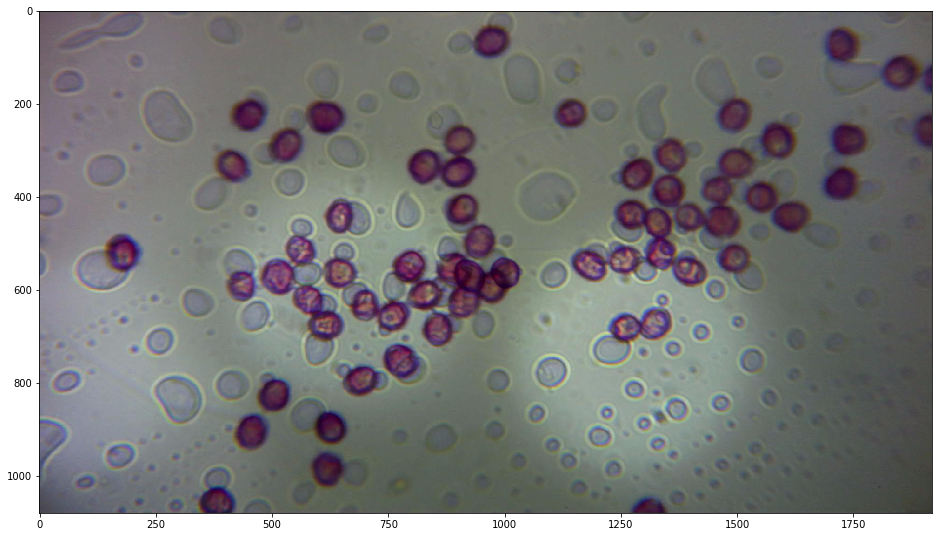

Processing '6' folder...
6 folder


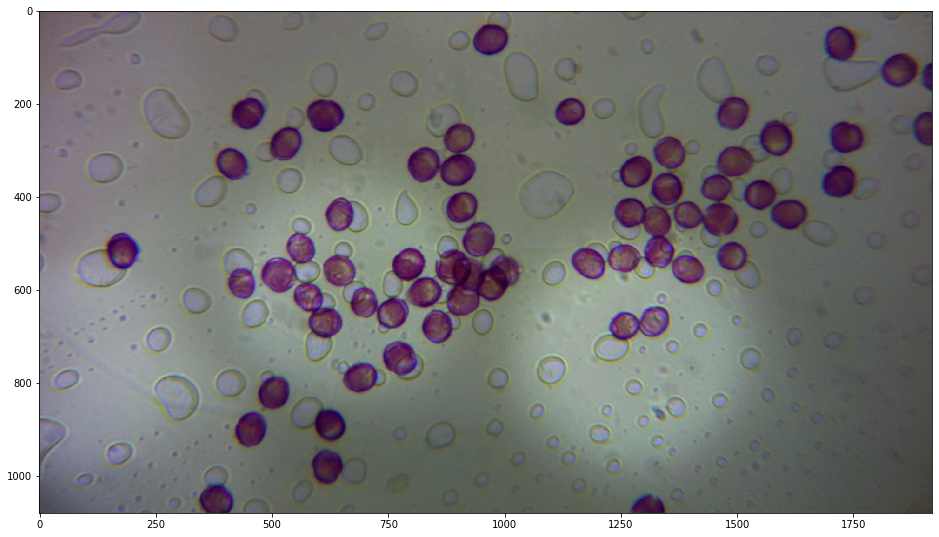

Processing '7' folder...
7 folder


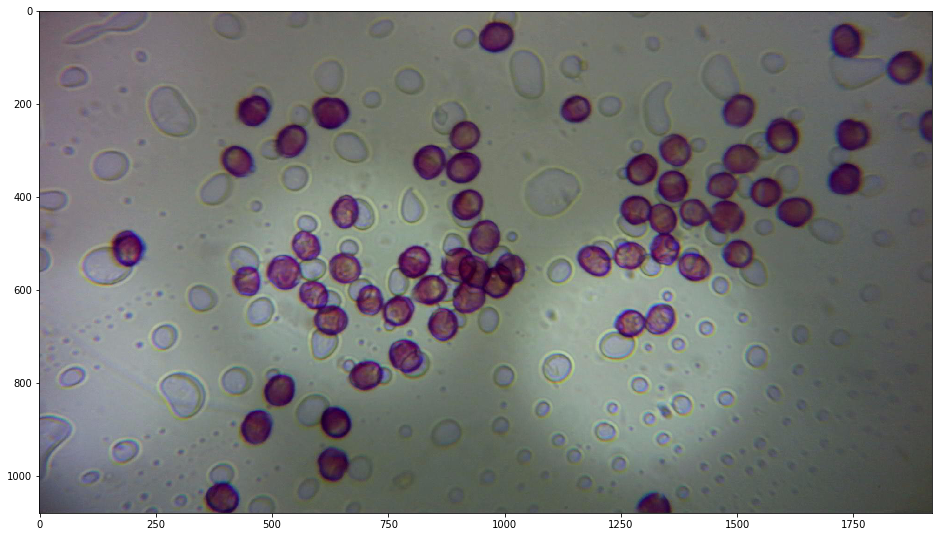

In [30]:
###Imágenes de partida Image Stack:
################################################################
EXTENSIONS = set(["bmp", "jpeg", "jpg", "png", "tif", "tiff"])
for imgStack in range(8):
    #Cargamos los directorios:
    src_dir = "Muestra10/"+str(imgStack)
    src_contents = os.walk(src_dir)
    dirpath, _, fnames = next(src_contents)

    image_dir = os.path.split(dirpath)[-1]

    print("Processing '" + image_dir + "' folder...")

    image_files = sorted([os.path.join(dirpath, name) for name in fnames])
    image_files = [cv2.imread(name) for name in image_files
              if os.path.splitext(name)[-1][1:].lower() in EXTENSIONS]

    if any([image is None for image in image_files]):
        raise RuntimeError("One or more input files failed to load.")
    print(image_dir + " folder")
    #Representamos una imagen de cada directorio:
    plt.figure(figsize=(16,11))
    plt.imshow(cv2.cvtColor(image_files[0], cv2.COLOR_BGR2RGB))
    plt.show()

In [24]:
#Se aplica Image Stack:
for imgStack in range(8):
    image_folder = "Muestra10/"+str(imgStack)
    print(image_folder)
    if not os.path.exists(str(image_folder)):
        print("ERROR {} not found!".format(str(image_folder)))
        exit()
    file_list = os.listdir(str(image_folder))
    file_list = [os.path.join(str(image_folder), x)
                for x in file_list if x.endswith(('.jpg', '.png','.bmp'))]
    print(str(image_folder) + " folder is ready")
    stacked_image = stackImagesECC(file_list)
    #Save image
    dir = './Muestra10/Image_Stack'
    if not os.path.exists(dir):
        os.mkdir(dir)
    Img = 'Muestra10/Image_Stack/stacked_img_'+str(imgStack)+'.jpg'
    cv2.imwrite(str(Img),stacked_image)

Muestra10/0
Muestra10/0 folder is ready
Muestra10/0\1.jpg
Muestra10/0\10.jpg
Muestra10/0\2.jpg
Muestra10/0\3.jpg
Muestra10/0\4.jpg
Muestra10/0\5.jpg
Muestra10/0\6.jpg
Muestra10/0\7.jpg
Muestra10/0\8.jpg
Muestra10/0\9.jpg
Muestra10/1
Muestra10/1 folder is ready
Muestra10/1\1.jpg
Muestra10/1\10.jpg
Muestra10/1\2.jpg
Muestra10/1\3.jpg
Muestra10/1\4.jpg
Muestra10/1\5.jpg
Muestra10/1\6.jpg
Muestra10/1\7.jpg
Muestra10/1\8.jpg
Muestra10/1\9.jpg
Muestra10/2
Muestra10/2 folder is ready
Muestra10/2\1.jpg
Muestra10/2\10.jpg
Muestra10/2\2.jpg
Muestra10/2\3.jpg
Muestra10/2\4.jpg
Muestra10/2\5.jpg
Muestra10/2\6.jpg
Muestra10/2\7.jpg
Muestra10/2\8.jpg
Muestra10/2\9.jpg
Muestra10/3
Muestra10/3 folder is ready
Muestra10/3\1.jpg
Muestra10/3\10.jpg
Muestra10/3\2.jpg
Muestra10/3\3.jpg
Muestra10/3\4.jpg
Muestra10/3\5.jpg
Muestra10/3\6.jpg
Muestra10/3\7.jpg
Muestra10/3\8.jpg
Muestra10/3\9.jpg
Muestra10/4
Muestra10/4 folder is ready
Muestra10/4\1.jpg
Muestra10/4\10.jpg
Muestra10/4\2.jpg
Muestra10/4\3.jpg
Mue

Image 0


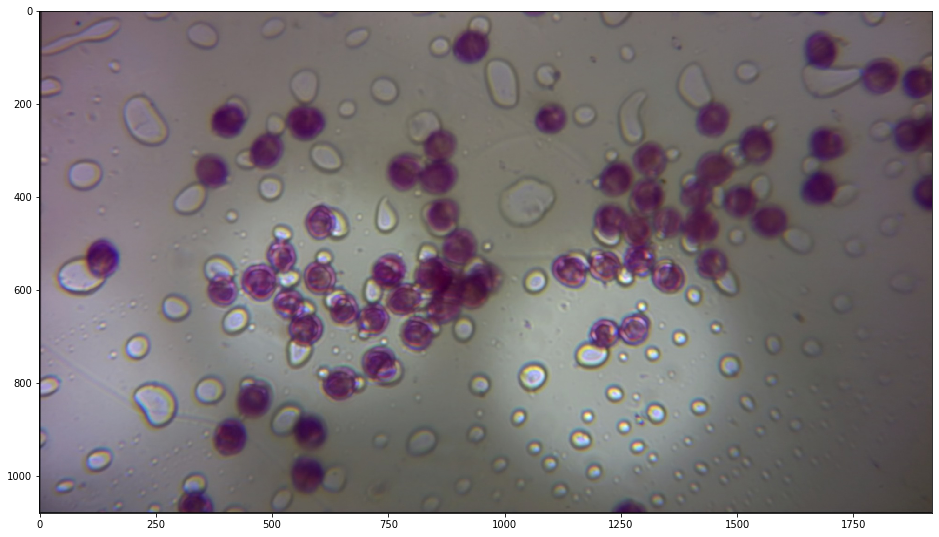

Image 4


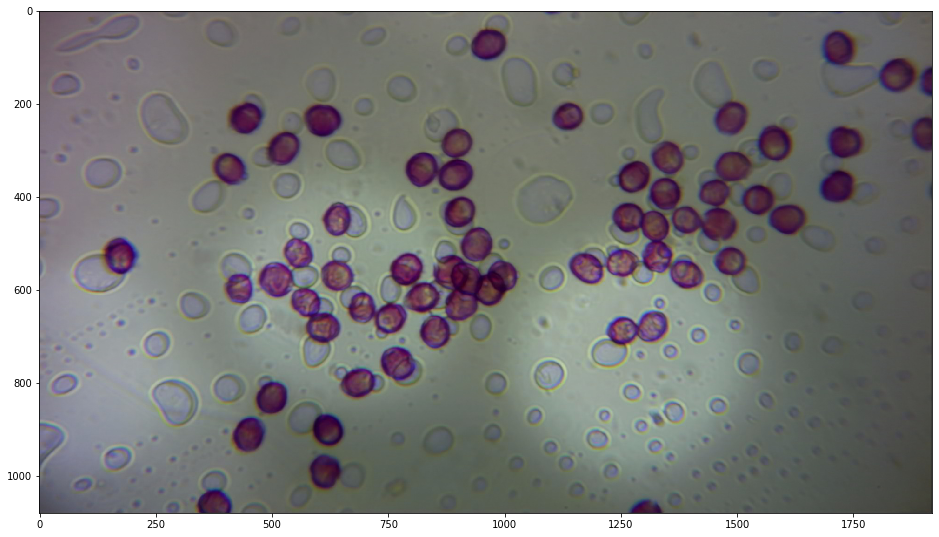

Image 6


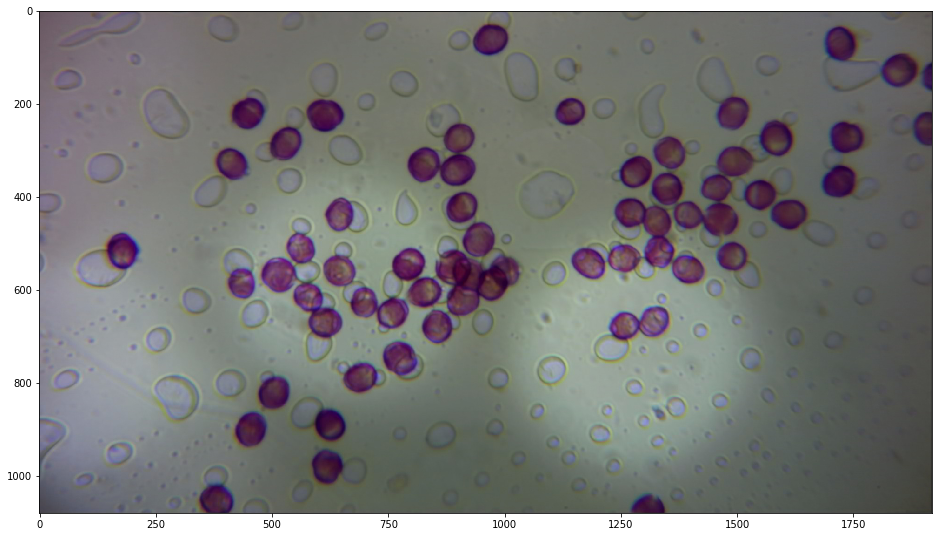

In [28]:
###Imágenes de partida Focus Stack:
################################################################
plt.figure(figsize=(16,11))
print('Image 0')
plt.imshow(cv2.cvtColor(image_files[0], cv2.COLOR_BGR2RGB))
plt.show()
################################################################
plt.figure(figsize=(16,11))
print('Image 4')
plt.imshow(cv2.cvtColor(image_files[4], cv2.COLOR_BGR2RGB))
plt.show()
################################################################
plt.figure(figsize=(16,11))
print('Image 6')
plt.imshow(cv2.cvtColor(image_files[6], cv2.COLOR_BGR2RGB))
plt.show()

Processing 'Image_Stack' folder...
Image_Stack folder is ready
Focus stack realizado


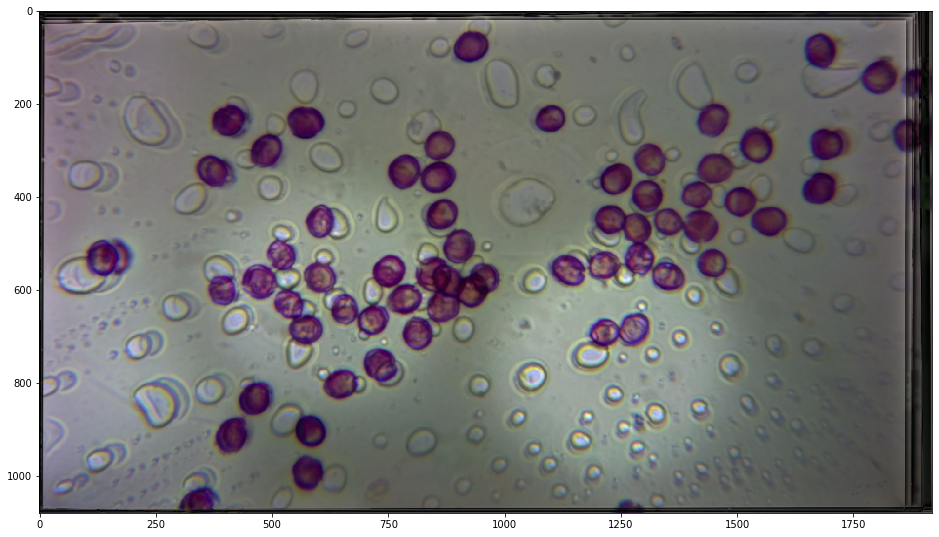

True

In [25]:
#Se aplica Focus Stack:
EXTENSIONS = set(["bmp", "jpeg", "jpg", "png", "tif", "tiff"])

src_dir = "Muestra10/Image_Stack"
src_contents = os.walk(src_dir)
dirpath, _, fnames = next(src_contents)

image_dir = os.path.split(dirpath)[-1]

print("Processing '" + image_dir + "' folder...")

image_files = sorted([os.path.join(dirpath, name) for name in fnames])
image_files = [cv2.imread(name) for name in image_files
          if os.path.splitext(name)[-1][1:].lower() in EXTENSIONS]

if any([image is None for image in image_files]):
    raise RuntimeError("One or more input files failed to load.")
print(image_dir + " folder is ready")
################################################################
stacked = stk.stack_focus(
    image_files,
    choice=stk.CHOICE_PYRAMID,
    energy=stk.ENERGY_LAPLACIAN,
    pyramid_min_size=32,
    kernel_size=5,
    blur_size=5,
    smooth_size=32)
print("Focus stack realizado")
plt.figure(figsize=(16,11))
plt.imshow(cv2.cvtColor(stacked, cv2.COLOR_BGR2RGB))
plt.show()
################################################################
cv2.imwrite('image+focus_stack_10x.jpg',stacked)